# Features are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image.
n the 3-dimensional space is that described in: [K. P. Bennett and O. L. Mangasarian: "Robust Linear Programming Discrimination of Two Linearly Inseparable Sets", Optimization Methods and Software 1, 1992, 23-34].

This database is also available through the UW CS ftp server:
ftp ftp.cs.wisc.edu
cd math-prog/cpo-dataset/machine-learn/WDBC/

Also can be found on UCI Machine Learning Repository: https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%28Diagnostic%29




Attribute Information:

1) ID number
2) Diagnosis (M = malignant, B = benign)
3-32)

* Ten real-valued features are computed for each cell nucleus:

*a) radius (mean of distances from center to points on the perimeter)

*b) texture (standard deviation of gray-scale values)

*c) perimeter

*d) area

*e) smoothness (local variation in radius lengths)

*f) compactness (perimeter^2 / area - 1.0)

*g) concavity (severity of concave portions of the contour)

*h) concave points (number of concave portions of the contour)


In [1]:
import pandas as pd 
import matplotlib.pyplot as plt


In [2]:
case = pd.read_csv('cancer_data.csv')

In [3]:
case.info

<bound method DataFrame.info of            id diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0      842302         M        17.99           NaN          122.80     1001.0   
1      842517         M        20.57         17.77          132.90     1326.0   
2    84300903         M        19.69         21.25          130.00     1203.0   
3    84348301         M        11.42         20.38           77.58      386.1   
4    84358402         M        20.29         14.34          135.10     1297.0   
..        ...       ...          ...           ...             ...        ...   
564    926424         M        21.56         22.39          142.00     1479.0   
565    926682         M        20.13         28.25          131.20     1261.0   
566    926954         M        16.60         28.08          108.30      858.1   
567    927241         M        20.60         29.33          140.10     1265.0   
568     92751         B         7.76         24.54           47.92      181.0

In [4]:
case.head(15)


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_max,texture_max,perimeter_max,area_max,smoothness_max,compactness_max,concavity_max,concave_points_max,symmetry_max,fractal_dimension_max
0,842302,M,17.99,NaN,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.38,NaN,184.60,2019.0,0.1622,0.6656,0.7119,0.26540,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.18600,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.24300,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,NaN,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,NaN,0.8663,0.6869,0.25750,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.16250,0.2364,0.07678
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.17410,0.3985,0.12440
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.19320,NaN,0.08368
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.15560,0.3196,0.11510
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.20600,0.4378,0.10720
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.22100,0.4366,0.20750


In [5]:
for a,z in enumerate(case.columns):
    print(a, z)

0 id
1 diagnosis
2 radius_mean
3 texture_mean
4 perimeter_mean
5 area_mean
6 smoothness_mean
7 compactness_mean
8 concavity_mean
9 concave_points_mean
10 symmetry_mean
11 fractal_dimension_mean
12 radius_SE
13 texture_SE
14 perimeter_SE
15 area_SE
16 smoothness_SE
17 compactness_SE
18 concavity_SE
19 concave_points_SE
20 symmetry_SE
21 fractal_dimension_SE
22 radius_max
23 texture_max
24 perimeter_max
25 area_max
26 smoothness_max
27 compactness_max
28 concavity_max
29 concave_points_max
30 symmetry_max
31 fractal_dimension_max


In [6]:
case.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_SE', 'texture_SE', 'perimeter_SE', 'area_SE', 'smoothness_SE',
       'compactness_SE', 'concavity_SE', 'concave_points_SE', 'symmetry_SE',
       'fractal_dimension_SE', 'radius_max', 'texture_max', 'perimeter_max',
       'area_max', 'smoothness_max', 'compactness_max', 'concavity_max',
       'concave_points_max', 'symmetry_max', 'fractal_dimension_max'],
      dtype='object')

In [7]:
case_1 = pd.read_csv('cancer_data.csv', index_col=[ 'id'])


In [8]:
case_1.head(50)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_max,texture_max,perimeter_max,area_max,smoothness_max,compactness_max,concavity_max,concave_points_max,symmetry_max,fractal_dimension_max
id,,,,,,,,,,,,,,,,,,,,,
842302,M,17.990,NaN,122.80,1001.0,0.11840,0.27760,0.30010,0.147100,0.2419,...,25.380,NaN,184.60,2019.0,0.16220,0.66560,0.71190,0.26540,0.4601,0.11890
842517,M,20.570,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.070170,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.24160,0.18600,0.2750,0.08902
84300903,M,19.690,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.127900,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.45040,0.24300,0.3613,0.08758
84348301,M,11.420,20.38,77.58,386.1,NaN,0.28390,0.24140,0.105200,0.2597,...,14.910,26.50,98.87,567.7,NaN,0.86630,0.68690,0.25750,0.6638,0.17300
84358402,M,20.290,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.104300,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.40000,0.16250,0.2364,0.07678
843786,M,12.450,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.080890,0.2087,...,15.470,23.75,103.40,741.6,0.17910,0.52490,0.53550,0.17410,0.3985,0.12440
844359,M,18.250,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.074000,NaN,...,22.880,27.66,153.20,1606.0,0.14420,0.25760,0.37840,0.19320,NaN,0.08368
84458202,M,13.710,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.059850,0.2196,...,17.060,28.14,110.60,897.0,0.16540,0.36820,0.26780,0.15560,0.3196,0.11510
844981,M,13.000,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.093530,0.2350,...,15.490,30.73,106.20,739.3,0.17030,0.54010,0.53900,0.20600,0.4378,0.10720


In [9]:
labels = ['id', 'area_mean', ]


In [10]:
case_2 = pd.read_csv('cancer_data.csv',names = labels)


In [11]:
case_2.head(11)

,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,id,area_mean
id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,radius_SE,texture_SE,perimeter_SE,area_SE,smoothness_SE,compactness_SE,concavity_SE,concave_points_SE,symmetry_SE,fractal_dimension_SE,radius_max,texture_max,perimeter_max,area_max,smoothness_max,compactness_max,concavity_max,concave_points_max,symmetry_max,fractal_dimension_max
842302,M,17.99,NaN,122.8,1001,0.1184,0.2776,0.3001,0.1471,0.2419,0.07871,1.095,NaN,8.589,153.4,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,NaN,184.6,2019,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189
842517,M,20.57,17.77,132.9,1326,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.0186,0.0134,0.01389,0.003532,24.99,23.41,158.8,1956,0.1238,0.1866,0.2416,0.186,0.275,0.08902
84300903,M,19.69,21.25,130,1203,0.1096,0.1599,0.1974,0.1279,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.00615,0.04006,0.03832,0.02058,0.0225,0.004571,23.57,25.53,152.5,1709,0.1444,0.4245,0.4504,0.243,0.3613,0.08758
84348301,M,11.42,20.38,77.58,386.1,NaN,0.2839,0.2414,0.1052,0.2597,0.09744,0.4956,1.156,3.445,27.23,NaN,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.5,98.87,567.7,NaN,0.8663,0.6869,0.2575,0.6638,0.173
84358402,M,20.29,14.34,135.1,1297,0.1003,0.1328,0.198,0.1043,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.01149,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.2,1575,0.1374,0.205,0.4,0.1625,0.2364,0.07678
843786,M,12.45,15.7,82.57,477.1,0.1278,0.17,0.1578,0.08089,0.2087,0.07613,0.3345,0.8902,2.217,27.19,0.00751,0.03345,0.03672,0.01137,0.02165,0.005082,15.47,23.75,103.4,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.1244
844359,M,18.25,19.98,119.6,1040,0.09463,0.109,0.1127,0.074,NaN,0.05742,0.4467,0.7732,3.18,53.91,0.004314,0.01382,0.02254,0.01039,NaN,0.002179,22.88,27.66,153.2,1606,0.1442,0.2576,0.3784,0.1932,NaN,0.08368
84458202,M,13.71,20.83,90.2,577.9,0.1189,0.1645,0.09366,0.05985,0.2196,0.07451,0.5835,1.377,3.856,50.96,0.008805,0.03029,0.02488,0.01448,0.01486,0.005412,17.06,28.14,110.6,897,0.1654,0.3682,0.2678,0.1556,0.3196,0.1151
844981,M,13,21.82,87.5,519.8,0.1273,0.1932,0.1859,0.09353,0.235,0.07389,0.3063,1.002,2.406,24.32,0.005731,0.03502,0.03553,0.01226,0.02143,0.003749,15.49,30.73,106.2,739.3,0.1703,0.5401,0.539,0.206,0.4378,0.1072


 # Assessing and Building Intuition 

In [12]:
case.shape

(569, 32)

In [13]:
case.dtypes

id                          int64
diagnosis                  object
radius_mean               float64
texture_mean              float64
perimeter_mean            float64
area_mean                 float64
smoothness_mean           float64
compactness_mean          float64
concavity_mean            float64
concave_points_mean       float64
symmetry_mean             float64
fractal_dimension_mean    float64
radius_SE                 float64
texture_SE                float64
perimeter_SE              float64
area_SE                   float64
smoothness_SE             float64
compactness_SE            float64
concavity_SE              float64
concave_points_SE         float64
symmetry_SE               float64
fractal_dimension_SE      float64
radius_max                float64
texture_max               float64
perimeter_max             float64
area_max                  float64
smoothness_max            float64
compactness_max           float64
concavity_max             float64
concave_points

In [14]:
case.nunique()

id                        562
diagnosis                   2
radius_mean               451
texture_mean              459
perimeter_mean            516
area_mean                 532
smoothness_mean           434
compactness_mean          530
concavity_mean            530
concave_points_mean       536
symmetry_mean             394
fractal_dimension_mean    494
radius_SE                 535
texture_SE                499
perimeter_SE              526
area_SE                   523
smoothness_SE             495
compactness_SE            534
concavity_SE              526
concave_points_SE         500
symmetry_SE               438
fractal_dimension_SE      539
radius_max                452
texture_max               490
perimeter_max             510
area_max                  537
smoothness_max            378
compactness_max           523
concavity_max             532
concave_points_max        485
symmetry_max              449
fractal_dimension_max     530
dtype: int64

In [15]:
case.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_max,texture_max,perimeter_max,area_max,smoothness_max,compactness_max,concavity_max,concave_points_max,symmetry_max,fractal_dimension_max
count,5.690000e+02,569.000000,548.000000,569.000000,569.000000,521.000000,569.000000,569.000000,569.000000,504.000000,...,569.000000,548.000000,569.000000,569.000000,521.000000,569.000000,569.000000,569.000000,504.000000,569.000000
mean,3.051467e+07,14.113021,19.293431,91.877909,653.288576,0.096087,0.104536,0.088620,0.048837,0.181091,...,16.261896,25.660803,107.211142,880.163796,0.132090,0.254557,0.271681,0.114377,0.288856,0.084012
std,1.250417e+08,3.506148,4.327287,24.162787,349.476899,0.013924,0.052674,0.079011,0.038578,0.027899,...,4.841175,6.202916,33.621975,570.498628,0.022685,0.158042,0.208298,0.065760,0.062520,0.018151
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.691040e+05,11.700000,16.167500,75.170000,420.300000,0.086050,0.065260,0.029560,0.020360,0.161800,...,13.010000,21.017500,84.110000,515.300000,0.116600,0.146000,0.112500,0.064020,0.247650,0.071270
50%,9.060240e+05,13.370000,18.785000,86.340000,551.100000,0.095780,0.094530,0.061550,0.033700,0.178950,...,14.970000,25.370000,97.650000,686.500000,0.131200,0.211900,0.226700,0.100100,0.280650,0.080040
75%,8.910251e+06,15.780000,21.825000,103.800000,782.700000,0.104800,0.130500,0.131900,0.074040,0.195750,...,18.760000,29.675000,125.100000,1070.000000,0.145000,0.339900,0.385300,0.162500,0.317525,0.092110
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [16]:
case.tail(2)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_max,texture_max,perimeter_max,area_max,smoothness_max,compactness_max,concavity_max,concave_points_max,symmetry_max,fractal_dimension_max
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.3514,0.152,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.265,0.4087,0.12400
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.0000,0.000,...,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.000,0.2871,0.07039


In [17]:
for i, v in enumerate(case.columns):
    print(i, v)

0 id
1 diagnosis
2 radius_mean
3 texture_mean
4 perimeter_mean
5 area_mean
6 smoothness_mean
7 compactness_mean
8 concavity_mean
9 concave_points_mean
10 symmetry_mean
11 fractal_dimension_mean
12 radius_SE
13 texture_SE
14 perimeter_SE
15 area_SE
16 smoothness_SE
17 compactness_SE
18 concavity_SE
19 concave_points_SE
20 symmetry_SE
21 fractal_dimension_SE
22 radius_max
23 texture_max
24 perimeter_max
25 area_max
26 smoothness_max
27 compactness_max
28 concavity_max
29 concave_points_max
30 symmetry_max
31 fractal_dimension_max


In [18]:
case.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_SE', 'texture_SE', 'perimeter_SE', 'area_SE', 'smoothness_SE',
       'compactness_SE', 'concavity_SE', 'concave_points_SE', 'symmetry_SE',
       'fractal_dimension_SE', 'radius_max', 'texture_max', 'perimeter_max',
       'area_max', 'smoothness_max', 'compactness_max', 'concavity_max',
       'concave_points_max', 'symmetry_max', 'fractal_dimension_max'],
      dtype='object')

# Indexing and Selecting Data in Pandas
Let's separate this dataframe into three new dataframes - one for each metric (mean, standard error, and maximum). To get the data for each dataframe, we need to select the id and diagnosis columns, as well as the ten columns for that metric.

In [19]:
case_means = case.iloc[:,:12]
case_means.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean
0,842302,M,17.99,NaN,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999
3,84348301,M,11.42,20.38,77.58,386.1,NaN,0.28390,0.2414,0.10520,0.2597,0.09744
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883


In [20]:
case_means.to_csv('cancer_data_means.csv', index=False)

In [21]:
case_means.head(20)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean
0,842302,M,17.99,NaN,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999
3,84348301,M,11.42,20.38,77.58,386.1,NaN,0.28390,0.24140,0.10520,0.2597,0.09744
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,0.2087,0.07613
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,NaN,0.05742
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,0.2196,0.07451
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,0.2350,0.07389
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,0.2030,0.08243


In [22]:
case.count()

id                        569
diagnosis                 569
radius_mean               569
texture_mean              548
perimeter_mean            569
area_mean                 569
smoothness_mean           521
compactness_mean          569
concavity_mean            569
concave_points_mean       569
symmetry_mean             504
fractal_dimension_mean    569
radius_SE                 569
texture_SE                548
perimeter_SE              569
area_SE                   569
smoothness_SE             521
compactness_SE            569
concavity_SE              569
concave_points_SE         569
symmetry_SE               504
fractal_dimension_SE      569
radius_max                569
texture_max               548
perimeter_max             569
area_max                  569
smoothness_max            521
compactness_max           569
concavity_max             569
concave_points_max        569
symmetry_max              504
fractal_dimension_max     569
dtype: int64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001BF26244BE0>,
      dtype=object)

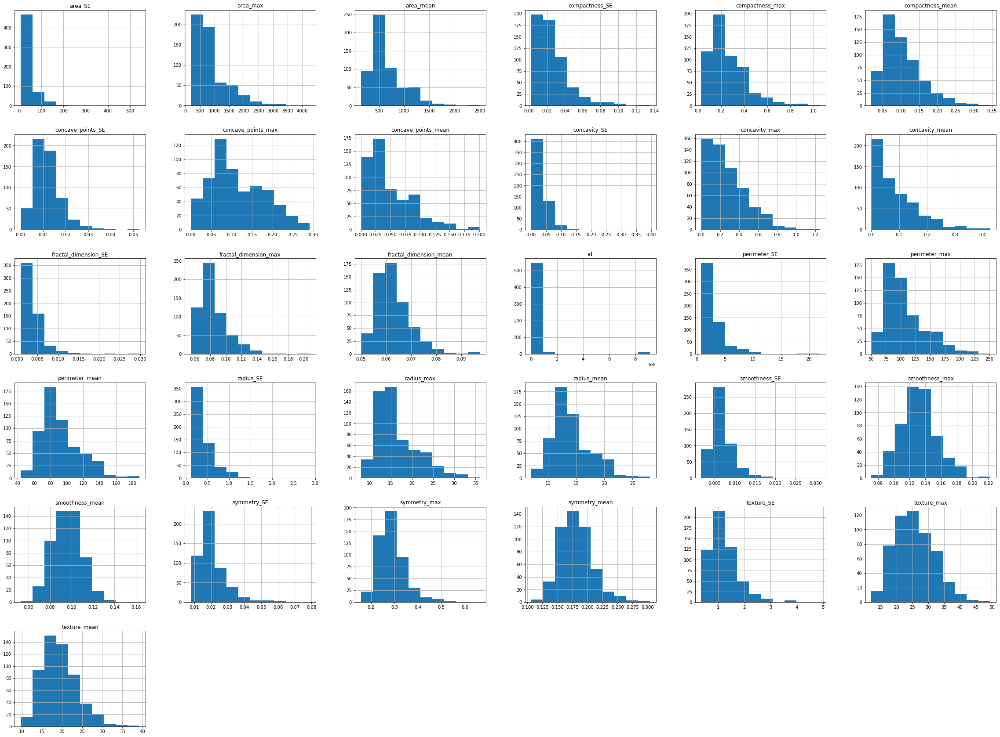

In [23]:
case.hist(figsize=(40,30))

In [24]:
case_means.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      569 non-null    int64  
 1   diagnosis               569 non-null    object 
 2   radius_mean             569 non-null    float64
 3   texture_mean            548 non-null    float64
 4   perimeter_mean          569 non-null    float64
 5   area_mean               569 non-null    float64
 6   smoothness_mean         521 non-null    float64
 7   compactness_mean        569 non-null    float64
 8   concavity_mean          569 non-null    float64
 9   concave_points_mean     569 non-null    float64
 10  symmetry_mean           504 non-null    float64
 11  fractal_dimension_mean  569 non-null    float64
dtypes: float64(10), int64(1), object(1)
memory usage: 53.5+ KB


In [25]:
case.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      569 non-null    int64  
 1   diagnosis               569 non-null    object 
 2   radius_mean             569 non-null    float64
 3   texture_mean            548 non-null    float64
 4   perimeter_mean          569 non-null    float64
 5   area_mean               569 non-null    float64
 6   smoothness_mean         521 non-null    float64
 7   compactness_mean        569 non-null    float64
 8   concavity_mean          569 non-null    float64
 9   concave_points_mean     569 non-null    float64
 10  symmetry_mean           504 non-null    float64
 11  fractal_dimension_mean  569 non-null    float64
 12  radius_SE               569 non-null    float64
 13  texture_SE              548 non-null    float64
 14  perimeter_SE            569 non-null    fl

In [26]:
case_means.shape

(569, 12)

* there 569 of data frame at many coulmns null so big so we have to clean its 
* in  texture_mean coulmn 548 - 569 = 21 null ! and thats for a example ... 
* (symmetry_mean -texture_mean-smoothness_mean )        


### first we fix the means coulmns ....

In [27]:
mean = case['symmetry_mean'].mean()
case['symmetry_mean'].fillna(mean, inplace= True)

In [28]:
mean = case['smoothness_mean'].mean()
case['smoothness_mean'].fillna(mean, inplace= True)

In [29]:
mean = case['texture_mean'].mean()
case['texture_mean'].fillna(mean, inplace= True)

In [30]:
case.head(22)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_max,texture_max,perimeter_max,area_max,smoothness_max,compactness_max,concavity_max,concave_points_max,symmetry_max,fractal_dimension_max
0,842302,M,17.990,19.293431,122.80,1001.0,0.118400,0.27760,0.30010,0.14710,...,25.38,NaN,184.60,2019.0,0.1622,0.6656,0.71190,0.26540,0.4601,0.11890
1,842517,M,20.570,17.770000,132.90,1326.0,0.084740,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.24160,0.18600,0.2750,0.08902
2,84300903,M,19.690,21.250000,130.00,1203.0,0.109600,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.45040,0.24300,0.3613,0.08758
3,84348301,M,11.420,20.380000,77.58,386.1,0.096087,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,NaN,0.8663,0.68690,0.25750,0.6638,0.17300
4,84358402,M,20.290,14.340000,135.10,1297.0,0.100300,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.40000,0.16250,0.2364,0.07678
5,843786,M,12.450,15.700000,82.57,477.1,0.127800,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.53550,0.17410,0.3985,0.12440
6,844359,M,18.250,19.980000,119.60,1040.0,0.094630,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.37840,0.19320,NaN,0.08368
7,84458202,M,13.710,20.830000,90.20,577.9,0.118900,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.26780,0.15560,0.3196,0.11510
8,844981,M,13.000,21.820000,87.50,519.8,0.127300,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.53900,0.20600,0.4378,0.10720
9,84501001,M,12.460,24.040000,83.97,475.9,0.118600,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.10500,0.22100,0.4366,0.20750


In [31]:
max_case = case['texture_max'].max()
case['texture_max'].fillna(max, inplace= True)

In [32]:
max_case = case['smoothness_max'].max()
case['smoothness_max'].fillna(max, inplace= True)

In [33]:
max_case = case['symmetry_max'].max()
case['symmetry_max'].fillna(max, inplace= True)

### and here we have fixed the max coulmns 

In [34]:
case.head(22)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_max,texture_max,perimeter_max,area_max,smoothness_max,compactness_max,concavity_max,concave_points_max,symmetry_max,fractal_dimension_max
0,842302,M,17.990,19.293431,122.80,1001.0,0.118400,0.27760,0.30010,0.14710,...,25.38,<built-in function max>,184.60,2019.0,0.1622,0.6656,0.71190,0.26540,0.4601,0.11890
1,842517,M,20.570,17.770000,132.90,1326.0,0.084740,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.24160,0.18600,0.275,0.08902
2,84300903,M,19.690,21.250000,130.00,1203.0,0.109600,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.45040,0.24300,0.3613,0.08758
3,84348301,M,11.420,20.380000,77.58,386.1,0.096087,0.28390,0.24140,0.10520,...,14.91,26.5,98.87,567.7,<built-in function max>,0.8663,0.68690,0.25750,0.6638,0.17300
4,84358402,M,20.290,14.340000,135.10,1297.0,0.100300,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.40000,0.16250,0.2364,0.07678
5,843786,M,12.450,15.700000,82.57,477.1,0.127800,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.53550,0.17410,0.3985,0.12440
6,844359,M,18.250,19.980000,119.60,1040.0,0.094630,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.37840,0.19320,<built-in function max>,0.08368
7,84458202,M,13.710,20.830000,90.20,577.9,0.118900,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.26780,0.15560,0.3196,0.11510
8,844981,M,13.000,21.820000,87.50,519.8,0.127300,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.53900,0.20600,0.4378,0.10720
9,84501001,M,12.460,24.040000,83.97,475.9,0.118600,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.10500,0.22100,0.4366,0.20750


In [35]:
case.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
564    False
565    False
566    False
567    False
568    False
Length: 569, dtype: bool

# And there is no duplicated thats a good news  !!! :D 

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001BF2695F250>,
      dtype=object)

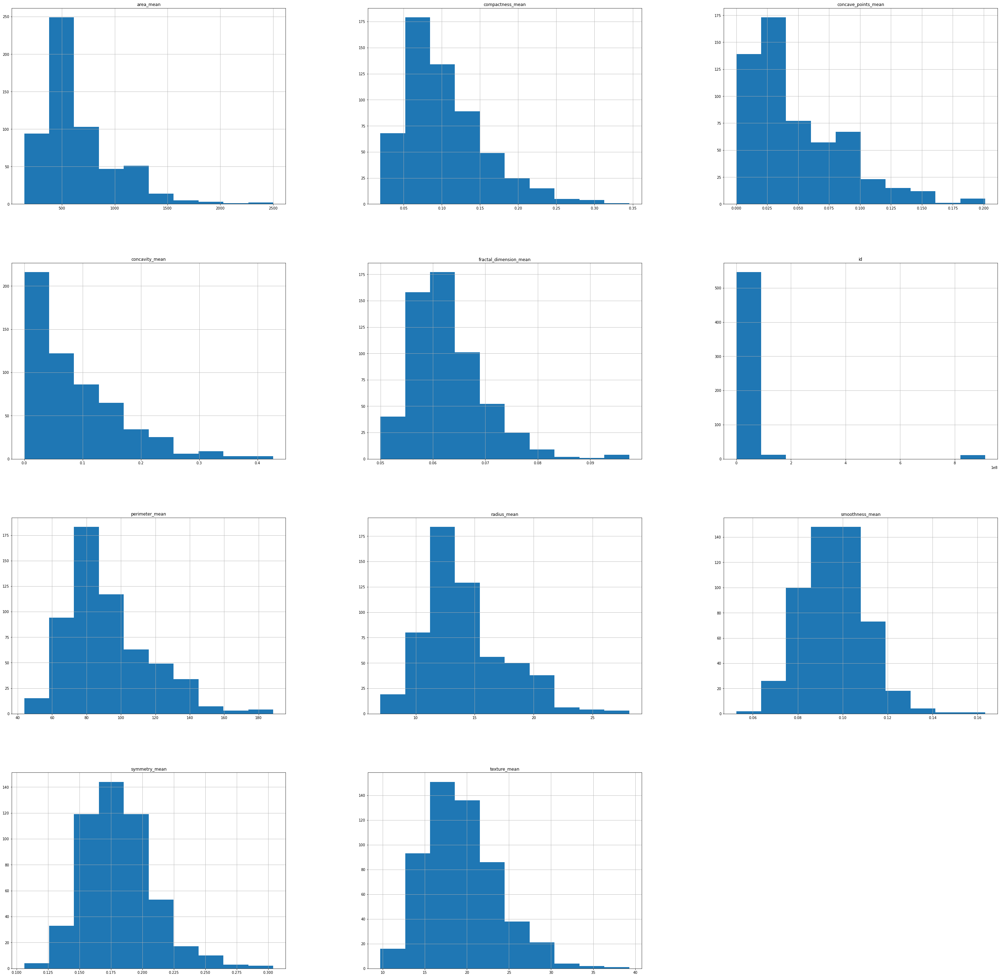

In [36]:
case_means.hist(figsize=(50,50))

# so now we gonna Exploring our Data 

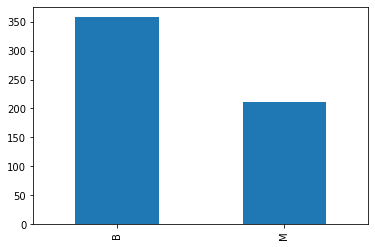

In [37]:
case['diagnosis'].value_counts().plot(kind = 'bar')

* You will notice that the number of people who have had a metastasis is 200 people

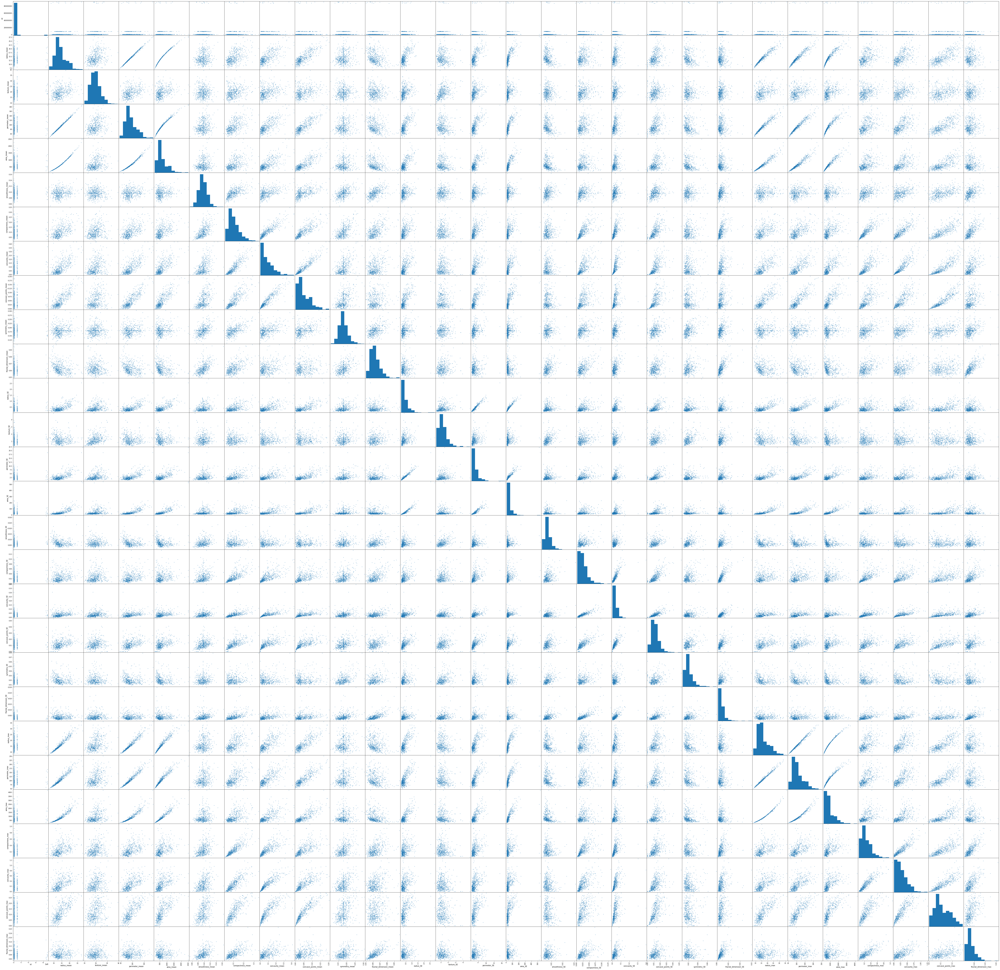

In [38]:
pd.plotting.scatter_matrix(case, figsize = (100,100));

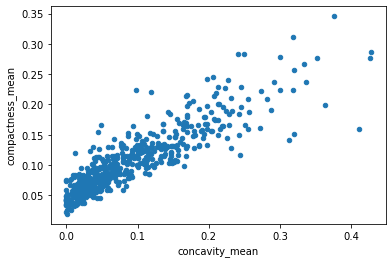

In [39]:
case.plot(x='concavity_mean' , y='compactness_mean' , kind= 'scatter' )

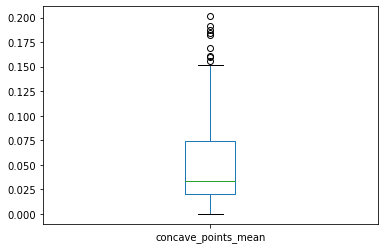

In [40]:
case['concave_points_mean'].plot(kind='box')

* The question is the size relationship of benign and malignant tumors

In [41]:
case_m= case[case['diagnosis']== 'M']

In [42]:
case_m.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_max,texture_max,perimeter_max,area_max,smoothness_max,compactness_max,concavity_max,concave_points_max,symmetry_max,fractal_dimension_max
0,842302,M,17.99,19.293431,122.80,1001.0,0.118400,0.27760,0.3001,0.14710,...,25.38,<built-in function max>,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.770000,132.90,1326.0,0.084740,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.275,0.08902
2,84300903,M,19.69,21.250000,130.00,1203.0,0.109600,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.380000,77.58,386.1,0.096087,0.28390,0.2414,0.10520,...,14.91,26.5,98.87,567.7,<built-in function max>,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.340000,135.10,1297.0,0.100300,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [43]:
mask = case['diagnosis']=='M'
print(mask)

0       True
1       True
2       True
3       True
4       True
       ...  
564     True
565     True
566     True
567     True
568    False
Name: diagnosis, Length: 569, dtype: bool


In [44]:
case_m = case[mask]
case_m.head(100)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_max,texture_max,perimeter_max,area_max,smoothness_max,compactness_max,concavity_max,concave_points_max,symmetry_max,fractal_dimension_max
0,842302,M,17.99,19.293431,122.80,1001.0,0.118400,0.27760,0.30010,0.14710,...,25.38,<built-in function max>,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.770000,132.90,1326.0,0.084740,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.275,0.08902
2,84300903,M,19.69,21.250000,130.00,1203.0,0.109600,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.380000,77.58,386.1,0.096087,0.28390,0.24140,0.10520,...,14.91,26.5,98.87,567.7,<built-in function max>,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.340000,135.10,1297.0,0.100300,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184,873885,M,15.28,22.410000,98.92,710.6,0.090570,0.10520,0.05375,0.03263,...,17.80,28.03,113.80,973.1,0.1301,0.3299,0.3630,0.1226,0.3175,0.09772
186,874217,M,18.31,19.293431,118.60,1041.0,0.085880,0.08468,0.08169,0.05814,...,21.31,<built-in function max>,139.20,1410.0,0.1234,0.2445,0.3538,0.1571,0.3206,0.06938
190,874858,M,14.22,23.120000,94.37,609.9,0.107500,0.24130,0.19810,0.06618,...,15.74,37.18,106.40,762.4,0.1533,0.9327,0.8488,0.1772,0.5166,0.14460
193,875263,M,12.34,26.860000,81.15,477.4,0.103400,0.13530,0.10850,0.04562,...,15.65,39.34,101.70,768.9,0.1785,0.4706,0.4425,0.1459,0.3215,0.12050


In [45]:
case_m['area_mean'].describe()

count     211.000000
mean      976.241706
std       364.656699
min       361.600000
25%       708.100000
50%       930.900000
75%      1198.500000
max      2501.000000
Name: area_mean, dtype: float64

In [46]:
case_b= case[case['diagnosis']== 'B']

In [47]:
case_b['area_mean'].describe()

count    358.000000
mean     462.944693
std      134.621250
min      143.500000
25%      374.975000
50%      458.550000
75%      551.550000
max      992.100000
Name: area_mean, dtype: float64

<function matplotlib.pyplot.show(*args, **kw)>

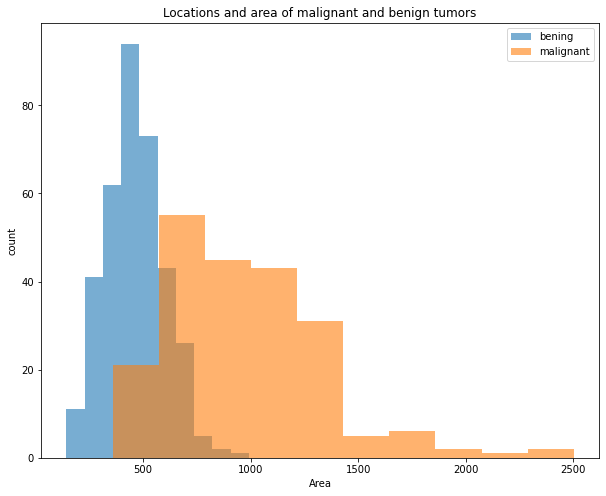

In [50]:
fig, ax =plt.subplots(figsize=(10,8))
ax.hist(case_b['area_mean'], alpha=0.6, label= 'bening')
ax.hist(case_m['area_mean'], alpha=0.6, label= 'malignant')
ax.set_title('Locations and area of malignant and benign tumors')
ax.set_xlabel('Area')
ax.set_ylabel('count')
ax.legend(loc='upper right')
plt.show

* Note that malignant tumors are usually large polyps